In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
housing_df=pd.read_csv('./train.csv')
housing_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
housing_df.shape

(1460, 81)

In [5]:
na_per_cols=(housing_df[housing_df.columns[(housing_df.isna().sum()!=0)]].isna().sum()/housing_df.shape[0])*100
na_per_cols

LotFrontage     17.739726
Alley           93.767123
MasVnrType       0.547945
MasVnrArea       0.547945
BsmtQual         2.534247
BsmtCond         2.534247
BsmtExposure     2.602740
BsmtFinType1     2.534247
BsmtFinType2     2.602740
Electrical       0.068493
FireplaceQu     47.260274
GarageType       5.547945
GarageYrBlt      5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
PoolQC          99.520548
Fence           80.753425
MiscFeature     96.301370
dtype: float64

In [6]:
na_per_cols[na_per_cols>=80]

Alley          93.767123
PoolQC         99.520548
Fence          80.753425
MiscFeature    96.301370
dtype: float64

In [7]:
housing_df.drop(columns=na_per_cols[na_per_cols>=80].index,axis=1,inplace=True)#finding the data with more than 80 % of null values in column ..coz its better to drop them
#unless they serve important business values.

#In this case the feature seems like an important variable in determining the variable
# but moost of the value are not available so lets keep those feature away to avoid complexity.
#plus few variable are explained by other variable for eg: poolarea availability means pool is available in the property
#which can be used  to derieve same information on availability using PoolQC

In [8]:
housing_df.shape

(1460, 77)

In [50]:
housing_df.FireplaceQu.fillna('NE',inplace=True) # since around 50% of data are available this can be good feature representing luxury
#in deciding thhe house price so we will try to populate the value.

#if there were more that 80% of records with no fireplace then this could have been ignored

In [51]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [9]:
housing_df[housing_df.LotFrontage.isna()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
7,8,60,RL,NaN,10382,Pave,IR1,Lvl,AllPub,Corner,...,228,0,0,0,350,11,2009,WD,Normal,200000
12,13,20,RL,NaN,12968,Pave,IR2,Lvl,AllPub,Inside,...,0,0,176,0,0,9,2008,WD,Normal,144000
14,15,20,RL,NaN,10920,Pave,IR1,Lvl,AllPub,Corner,...,176,0,0,0,0,5,2008,WD,Normal,157000
16,17,20,RL,NaN,11241,Pave,IR1,Lvl,AllPub,CulDSac,...,0,0,0,0,700,3,2010,WD,Normal,149000
24,25,20,RL,NaN,8246,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,5,2010,WD,Normal,154000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1429,1430,20,RL,NaN,12546,Pave,IR1,Lvl,AllPub,Corner,...,99,0,0,0,0,4,2007,WD,Normal,182900
1431,1432,120,RL,NaN,4928,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,10,2009,WD,Normal,143750
1441,1442,120,RM,NaN,4426,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,5,2008,WD,Normal,149300
1443,1444,30,RL,NaN,8854,Pave,Reg,Lvl,AllPub,Inside,...,0,0,40,0,0,5,2009,WD,Normal,121000


In [10]:
housing_df.LotFrontage.describe(percentiles=[.2,.4,.5,.6,.8,.1])

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
10%        44.000000
20%        53.000000
40%        63.000000
50%        69.000000
60%        74.000000
80%        85.000000
max       313.000000
Name: LotFrontage, dtype: float64

{'whiskers': [<matplotlib.lines.Line2D at 0x1e2b8da92e0>,
 'caps': [<matplotlib.lines.Line2D at 0x1e2b8da9880>,
 'boxes': [<matplotlib.lines.Line2D at 0x1e2b8d83e20>],
 'medians': [<matplotlib.lines.Line2D at 0x1e2b8da9e20>],
 'fliers': [<matplotlib.lines.Line2D at 0x1e2b8dba130>],
 'means': []}

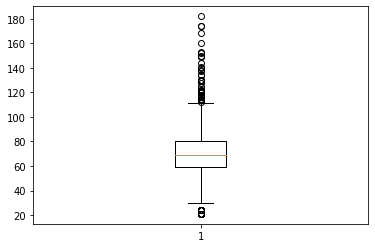

In [11]:
plt.boxplot(housing_df.LotFrontage[(~housing_df.LotFrontage.isna()) & (housing_df.LotFrontage!=313)]) 


In [12]:
#here we noticed more than 50 percentage of value are lying between the range of 60-80 after ignoring one outlier

In [13]:
housing_df[housing_df.LotFrontage==313]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
934,935,20,RL,313.0,27650,Pave,IR2,HLS,AllPub,Inside,...,0,0,0,0,0,11,2008,WD,Normal,242000
1298,1299,60,RL,313.0,63887,Pave,IR3,Bnk,AllPub,Corner,...,0,0,0,480,0,1,2008,New,Partial,160000


{'whiskers': [<matplotlib.lines.Line2D at 0x1e2bae9daf0>,
 'caps': [<matplotlib.lines.Line2D at 0x1e2baeac0d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x1e2bae9d820>],
 'medians': [<matplotlib.lines.Line2D at 0x1e2baeac670>],
 'fliers': [<matplotlib.lines.Line2D at 0x1e2baeac8e0>],
 'means': []}

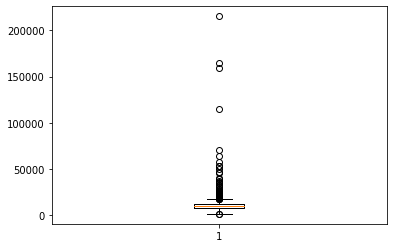

In [14]:
plt.boxplot(housing_df.LotArea) 

In [15]:
housing_df[housing_df.LotArea>50000]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
53,54,20,RL,68.0,50271,Pave,IR1,Low,AllPub,Inside,...,0,0,0,0,0,11,2006,WD,Normal,385000
249,250,50,RL,NaN,159000,Pave,IR2,Low,AllPub,CulDSac,...,0,0,0,0,500,6,2007,WD,Normal,277000
313,314,20,RL,150.0,215245,Pave,IR3,Low,AllPub,Inside,...,0,0,0,0,0,6,2009,WD,Normal,375000
335,336,190,RL,NaN,164660,Grvl,IR1,HLS,AllPub,Corner,...,0,0,0,0,700,8,2008,WD,Normal,228950
384,385,60,RL,NaN,53107,Pave,IR2,Low,AllPub,Corner,...,0,0,0,0,0,6,2007,WD,Normal,240000
451,452,20,RL,62.0,70761,Pave,IR1,Low,AllPub,Inside,...,0,0,0,0,0,12,2006,WD,Normal,280000
457,458,20,RL,NaN,53227,Pave,IR1,Low,AllPub,CulDSac,...,0,0,0,0,0,3,2008,WD,Normal,256000
706,707,20,RL,NaN,115149,Pave,IR2,Low,AllPub,CulDSac,...,0,0,0,0,0,6,2007,WD,Normal,302000
769,770,60,RL,47.0,53504,Pave,IR2,HLS,AllPub,CulDSac,...,0,0,210,0,0,6,2010,WD,Normal,538000
1298,1299,60,RL,313.0,63887,Pave,IR3,Bnk,AllPub,Corner,...,0,0,0,480,0,1,2008,New,Partial,160000


MoSold
1     AxesSubplot(0.125,0.125;0.775x0.755)
2     AxesSubplot(0.125,0.125;0.775x0.755)
3     AxesSubplot(0.125,0.125;0.775x0.755)
4     AxesSubplot(0.125,0.125;0.775x0.755)
5     AxesSubplot(0.125,0.125;0.775x0.755)
6     AxesSubplot(0.125,0.125;0.775x0.755)
7     AxesSubplot(0.125,0.125;0.775x0.755)
8     AxesSubplot(0.125,0.125;0.775x0.755)
9     AxesSubplot(0.125,0.125;0.775x0.755)
10    AxesSubplot(0.125,0.125;0.775x0.755)
11    AxesSubplot(0.125,0.125;0.775x0.755)
12    AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

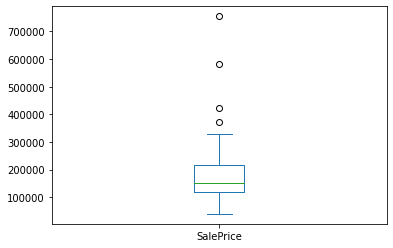

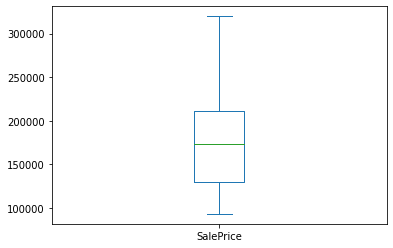

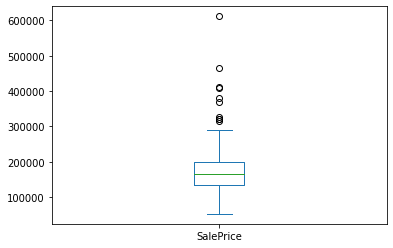

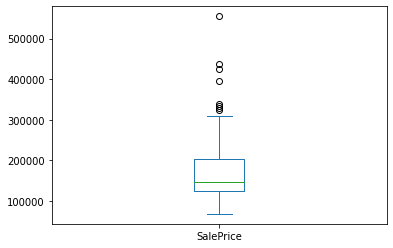

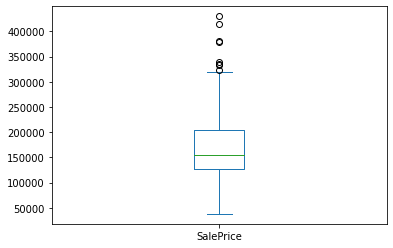

...

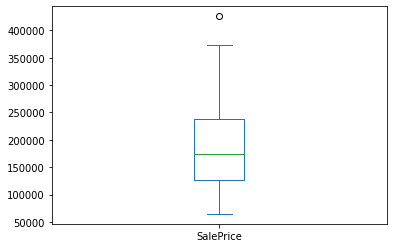

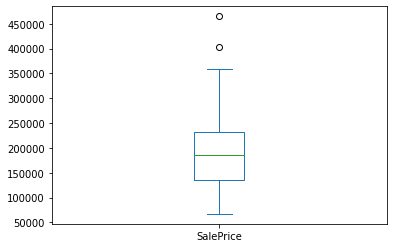

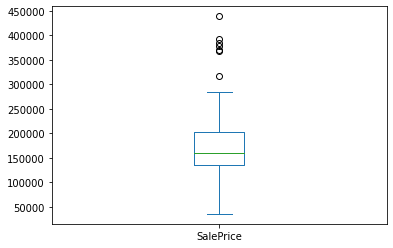

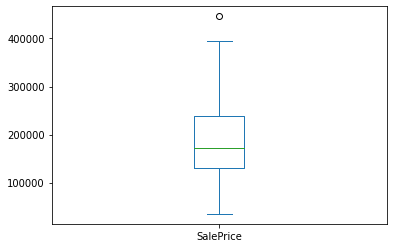

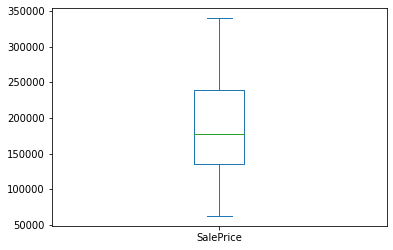

In [16]:
housing_df[['MoSold','SalePrice']].groupby(['MoSold']).plot(kind='box',y='SalePrice')

<AxesSubplot:xlabel='YrSold', ylabel='SalePrice'>

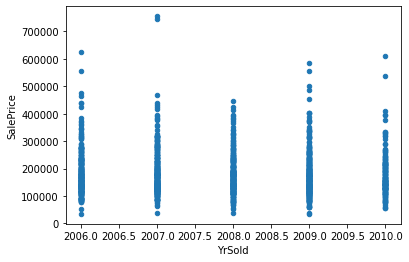

In [17]:
housing_df[['YrSold','SalePrice']].plot(kind='scatter',x='YrSold',y='SalePrice')

<AxesSubplot:xlabel='LotFrontage', ylabel='LotArea'>

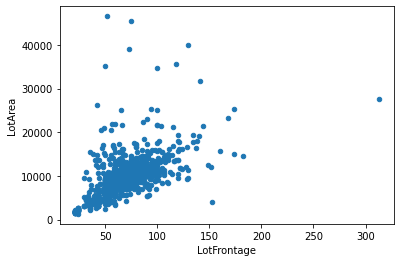

In [18]:
housing_df[(~housing_df.LotFrontage.isna()) & (housing_df.LotArea<50000)][['LotFrontage','LotArea']].plot(kind='scatter',x='LotFrontage',y='LotArea')

In [19]:
housing_df.LotFrontage.describe() #this is including the few outliers value

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

In [20]:
housing_df[(~housing_df.LotFrontage.isna()) & (housing_df.LotFrontage<200)].LotFrontage.describe() 
# without the outliers value doesnot looks so significant changes too
#so lets infer the value with the mean value for all the nan in lot frontage

count    1199.000000
mean       69.644704
std        22.181762
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       182.000000
Name: LotFrontage, dtype: float64

In [21]:
housing_df.LotFrontage.fillna(69,inplace=True)

In [22]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [23]:
housing_df.GarageType.fillna('NE',inplace=True)
#here the NA value means thereis no garage instead of refering to No data available so we will convert
# this as some random value which can be used later as feature.

In [24]:
housing_df.MasVnrType.value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [25]:
housing_df[housing_df.MasVnrType=='None'][['MasVnrArea','MasVnrType']].value_counts()#

MasVnrArea  MasVnrType
0.0         None          859
1.0         None            2
288.0       None            1
312.0       None            1
344.0       None            1
dtype: int64

In [26]:
housing_df.MasVnrArea.describe()

count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64

In [27]:
#In this case we will go with the majority and populate the missing value for ['MasVnrArea','MasVnrType'] with most common value
# i.e None and area of 0
housing_df.MasVnrArea.fillna(0,inplace=True)
housing_df.MasVnrType.fillna('None',inplace=True)

In [29]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [30]:
housing_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodD

In [31]:
housing_df[housing_df.BsmtFinType1.isna()][['BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF']]#here this information is indicating that there 
#is no basement instead of refering to the missing information about basement so we will use some default value indicating nobasement 


,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF
17,NaN,NaN,NaN,NaN,0,NaN,0,0,0
39,NaN,NaN,NaN,NaN,0,NaN,0,0,0
90,NaN,NaN,NaN,NaN,0,NaN,0,0,0
102,NaN,NaN,NaN,NaN,0,NaN,0,0,0
156,NaN,NaN,NaN,NaN,0,NaN,0,0,0
182,NaN,NaN,NaN,NaN,0,NaN,0,0,0
259,NaN,NaN,NaN,NaN,0,NaN,0,0,0
342,NaN,NaN,NaN,NaN,0,NaN,0,0,0
362,NaN,NaN,NaN,NaN,0,NaN,0,0,0
371,NaN,NaN,NaN,NaN,0,NaN,0,0,0


In [32]:
housing_df.fillna({'BsmtQual':'NE', 'BsmtCond':'NE',
       'BsmtExposure':'NE', 'BsmtFinType1':'NE', 'BsmtFinType2':'NE'},inplace=True)

In [33]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [34]:
housing_df[housing_df.GarageType=='NE'][['GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond']].isna().sum() # same pattern is seen in the garage information also 
#wwe will use this to impute the value for NA for these garage related fields

GarageType       0
GarageYrBlt     81
GarageFinish    81
GarageCars       0
GarageArea       0
GarageQual      81
GarageCond      81
dtype: int64

In [35]:
housing_df.GarageCond.value_counts()

TA    1326
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

In [36]:
housing_df.fillna({'GarageFinish':'NE',
       'GarageQual':'NE', 'GarageCond':'NE'},inplace=True)

In [37]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [38]:
housing_df.FireplaceQu

0       NaN
1        TA
2        TA
3        Gd
4        TA
       ... 
1455     TA
1456     TA
1457     Gd
1458    NaN
1459    NaN
Name: FireplaceQu, Length: 1460, dtype: object

In [39]:
#now that we have deal with all the missing value lets do the work of fixing the datatypes for the value. But before that
# lets remove some unnecessary column which will not give any value to out prediction
unused_cols=['Id','MiscVal','GarageYrBlt','FireplaceQu']
housing_df.drop(columns=unused_cols,inplace=True)

In [40]:
housing_df.shape

(1460, 73)

In [41]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 73 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [42]:
housing_df['MSSubClass']=housing_df.MSSubClass.astype(str) #coz its a categorical value having numeric category.

In [43]:
housing_df.Neighborhood.value_counts() #not sure if this column will give enough value so dropping it for now as it
# has so many possible values which are difficult to quantify too.

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

In [45]:
housing_df.drop(columns=['Neighborhood'],inplace=True)

KeyError: "['Neighborhood'] not found in axis"

In [46]:
# housing_df[['Condition1','Condition2']]
sum(housing_df.Condition1==housing_df.Condition2) #most of these value are same only few have more than 1 conditions

1265

In [47]:
housing_df[housing_df.Condition1!=housing_df.Condition2][['Condition1','Condition2']].value_counts()

Condition1  Condition2
Feedr       Norm          76
Artery      Norm          45
RRAn        Norm          22
PosN        Norm          17
RRAe        Norm          11
PosA        Norm           8
RRAn        Feedr          4
RRNn        Norm           4
Feedr       RRNn           2
RRNe        Norm           2
Artery      PosA           1
Feedr       RRAe           1
            RRAn           1
RRNn        Feedr          1
dtype: int64

In [48]:
# and out of the seecond condition available most of the additional condition is norm indicating normal so we can  get rid
# of this column too as its not giving any specific information and kind of 
#have repeated information capture by condition1 already.
housing_df.Condition1.value_counts()

Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64

In [49]:
housing_df.drop(columns=['Condition2'],inplace=True)

In [50]:
housing_df[housing_df.BldgType=='1Fam'][['BldgType','HouseStyle']].value_counts()

BldgType  HouseStyle
1Fam      1Story        607
          2Story        362
          1.5Fin        142
          SLvl           60
          SFoyer         20
          1.5Unf         13
          2.5Unf          9
          2.5Fin          7
dtype: int64

In [51]:
housing_df[housing_df.OverallQual==housing_df.OverallCond][['OverallQual', 'OverallCond']]  

,OverallQual,OverallCond
5,5,5
10,5,5
18,5,5
21,7,7
30,4,4
...,...,...
1443,6,6
1450,5,5
1452,5,5
1453,5,5


In [52]:
housing_df[['OverallQual', 'OverallCond']]=housing_df[['OverallQual', 'OverallCond']].astype(str)

In [53]:
import datetime
nowyear=datetime.datetime.now().year
house_age=nowyear-housing_df.YearBuilt
house_age

0        19
1        46
2        21
3       107
4        22
       ... 
1455     23
1456     44
1457     81
1458     72
1459     57
Name: YearBuilt, Length: 1460, dtype: int64

2022

In [54]:
housing_df['houseAge']=house_age # derieving the house age from built year.

In [55]:
housing_df[['houseAge','YearBuilt']]  #lets see if this year is really helpful. after derieving new feature of house age
# else we will remove this.

,houseAge,YearBuilt
0,19,2003
1,46,1976
2,21,2001
3,107,1915
4,22,2000
...,...,...
1455,23,1999
1456,44,1978
1457,81,1941
1458,72,1950


In [56]:
housing_df[['YearBuilt','YearRemodAdd']]

,YearBuilt,YearRemodAdd
0,2003,2003
1,1976,1976
2,2001,2002
3,1915,1970
4,2000,2000
...,...,...
1455,1999,2000
1456,1978,1988
1457,1941,2006
1458,1950,1996


In [57]:
housing_df[housing_df.Exterior1st!=housing_df.Exterior2nd][['Exterior1st','Exterior2nd']].value_counts()

Exterior1st  Exterior2nd
CemntBd      CmentBd        59
HdBoard      Plywood        23
WdShing      Wd Shng        17
BrkFace      Wd Sdng        12
Wd Sdng      Wd Shng         9
             Plywood         8
BrkFace      Plywood         6
WdShing      Plywood         5
Plywood      Brk Cmn         5
VinylSd      Wd Shng         5
MetalSd      HdBoard         3
Wd Sdng      ImStucc         3
BrkFace      HdBoard         3
Plywood      ImStucc         3
Stucco       Wd Shng         3
Plywood      HdBoard         2
WdShing      HdBoard         2
VinylSd      Plywood         2
MetalSd      Wd Sdng         2
Wd Sdng      VinylSd         2
             HdBoard         2
AsbShng      Plywood         2
Plywood      Wd Sdng         2
HdBoard      ImStucc         2
BrkComm      Brk Cmn         2
BrkFace      Stone           2
             Wd Shng         1
Wd Sdng      BrkFace         1
CemntBd      Wd Shng         1
             Wd Sdng         1
Wd Sdng      MetalSd         1
             S

In [61]:
housing_df[housing_df.GarageType=='NE'][['GarageType',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond']] 
# housing_df.drop(columns=['GarageYrBlt'],inplace=True)

,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
39,NE,NE,0,0,NE,NE
48,NE,NE,0,0,NE,NE
78,NE,NE,0,0,NE,NE
88,NE,NE,0,0,NE,NE
89,NE,NE,0,0,NE,NE
...,...,...,...,...,...,...
1349,NE,NE,0,0,NE,NE
1407,NE,NE,0,0,NE,NE
1449,NE,NE,0,0,NE,NE
1450,NE,NE,0,0,NE,NE


In [62]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 72 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   object 
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Condition1     1460 non-null   object 
 11  BldgType       1460 non-null   object 
 12  HouseStyle     1460 non-null   object 
 13  OverallQual    1460 non-null   object 
 14  OverallCond    1460 non-null   object 
 15  YearBuilt      1460 non-null   int64  
 16  YearRemodAdd   1460 non-null   int64  
 17  RoofStyle      1460 non-null   object 
 18  RoofMatl

In [64]:
 #now the data type looks aligned an and the cleaning work is also done at one level try to create a dummy feature as there are presence
    # of so many categorical columns
    
cat_cols=['MSSubClass', 'MSZoning', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Condition1', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond','RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1','BsmtFinType2',
       'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'GarageType',
       'GarageFinish','GarageQual', 'GarageCond',
       'PavedDrive', 'SaleType',
       'SaleCondition']

housing_df[cat_cols]

,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Condition1,BldgType,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,60,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Norm,1Fam,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,20,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Feedr,1Fam,...,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Norm,1Fam,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,70,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Norm,1Fam,...,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,60,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,Norm,1Fam,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Norm,1Fam,...,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1456,20,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Norm,1Fam,...,SBrkr,TA,Min1,Attchd,Unf,TA,TA,Y,WD,Normal
1457,70,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Norm,1Fam,...,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1458,20,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Norm,1Fam,...,FuseA,Gd,Typ,Attchd,Unf,TA,TA,Y,WD,Normal


In [65]:
housing_df1=pd.get_dummies(data=housing_df,columns=cat_cols,drop_first=True)

In [66]:
housing_df1.shape

(1460, 238)

In [67]:
housing_df1.columns.tolist()

['LotFrontage',
 'LotArea',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MoSold',
 'YrSold',
 'SalePrice',
 'houseAge',
 'MSSubClass_160',
 'MSSubClass_180',
 'MSSubClass_190',
 'MSSubClass_20',
 'MSSubClass_30',
 'MSSubClass_40',
 'MSSubClass_45',
 'MSSubClass_50',
 'MSSubClass_60',
 'MSSubClass_70',
 'MSSubClass_75',
 'MSSubClass_80',
 'MSSubClass_85',
 'MSSubClass_90',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'Utilities_NoSeWa',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'Lot

In [68]:
housing_df.drop(columns=['YearBuilt','MoSold', 'YrSold'],inplace=True)
# housing_df.drop(columns=['MoSold', 'YrSold'],inplace=True)

num_cols=[x for x in housing_df.columns if x not in cat_cols]
housing_df1.drop(columns=['YearBuilt','MoSold', 'YrSold'],inplace=True)
# housing_df1.drop(columns=['MoSold', 'YrSold'],inplace=True)

housing_df1[num_cols].describe()

,LotFrontage,LotArea,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,SalePrice,houseAge
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,69.863699,10516.828082,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,...,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,180921.195890,50.732192
std,22.027677,9981.264932,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,...,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,79442.502883,30.202904
min,21.000000,1300.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34900.000000,12.000000
25%,60.000000,7553.500000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,...,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,129975.000000,22.000000
50%,69.000000,9478.500000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,...,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,163000.000000,49.000000
75%,79.000000,11601.500000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,...,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,214000.000000,68.000000
max,313.000000,215245.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,...,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,755000.000000,150.000000


In [69]:
#analysing this we can clearly see that there are extreme values available in many columns lets see  if they are specific
# to any particular rows or spread across
housing_df1[housing_df1.SalePrice>350000][num_cols].max() #doesnot look suspecious

LotFrontage         174.0
LotArea          215245.0
YearRemodAdd       2010.0
MasVnrArea         1378.0
BsmtFinSF1         2188.0
BsmtFinSF2          820.0
BsmtUnfSF          2336.0
TotalBsmtSF        3200.0
1stFlrSF           3228.0
2ndFlrSF           2065.0
LowQualFinSF        572.0
GrLivArea          4476.0
BsmtFullBath          2.0
BsmtHalfBath          1.0
FullBath              3.0
HalfBath              1.0
BedroomAbvGr          4.0
KitchenAbvGr          1.0
TotRmsAbvGrd         12.0
Fireplaces            3.0
GarageCars            3.0
GarageArea         1220.0
WoodDeckSF          857.0
OpenPorchSF         274.0
EnclosedPorch       291.0
3SsnPorch           304.0
ScreenPorch         410.0
PoolArea            555.0
SalePrice        755000.0
houseAge            130.0
dtype: float64

<AxesSubplot:>

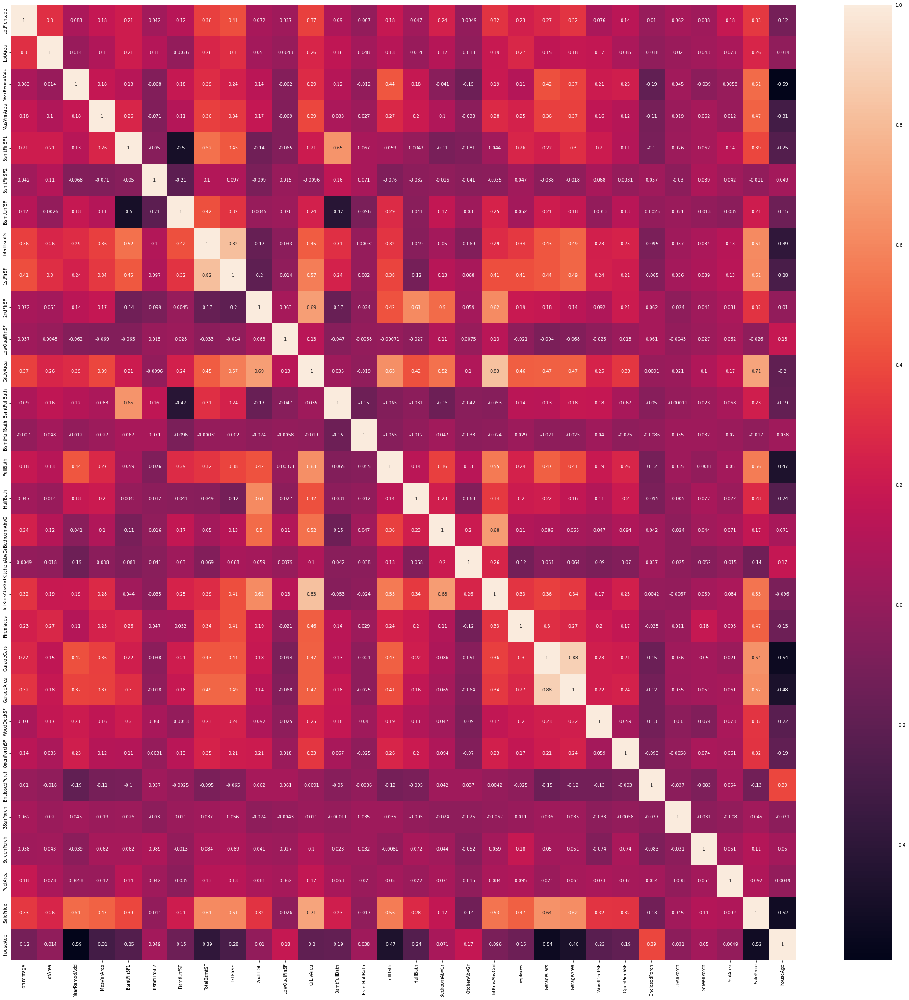

In [70]:
plt.figure(figsize=(40,40))
sns.heatmap(housing_df1[num_cols].corr(),annot=True)

In [71]:
#looking at this picture it seems most of the feature which are numeric
# has higer corelation with the sales price 
cat_cols_new=[x for x in housing_df1.columns if x not in num_cols]+['SalePrice']
cat_cols_new

['MSSubClass_160',
 'MSSubClass_180',
 'MSSubClass_190',
 'MSSubClass_20',
 'MSSubClass_30',
 'MSSubClass_40',
 'MSSubClass_45',
 'MSSubClass_50',
 'MSSubClass_60',
 'MSSubClass_70',
 'MSSubClass_75',
 'MSSubClass_80',
 'MSSubClass_85',
 'MSSubClass_90',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'Utilities_NoSeWa',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'LandSlope_Mod',
 'LandSlope_Sev',
 'Condition1_Feedr',
 'Condition1_Norm',
 'Condition1_PosA',
 'Condition1_PosN',
 'Condition1_RRAe',
 'Condition1_RRAn',
 'Condition1_RRNe',
 'Condition1_RRNn',
 'BldgType_2fmCon',
 'BldgType_Duplex',
 'BldgType_Twnhs',
 'BldgType_TwnhsE',
 'HouseStyle_1.5Unf',
 'HouseStyle_1Story',
 'HouseStyle_2.5Fin',
 'HouseStyle_2.5Unf',
 'HouseStyle_2Story',
 'HouseStyle_SFoyer',
 'HouseStyle_SLvl',
 'OverallQual_10',
 'Overa

In [72]:
#Lets analyze categorical featureset
plt.figure(figsize=(140,140))
sns.heatmap(housing_df1[cat_cols_new].corr(),annot=True)

<AxesSubplot:>

In [73]:
#difficult to analyze the pattern here so lets start training the model here since we already have the data in the required format.


In [75]:
import statsmodels.api  as sts
from sklearn.model_selection import train_test_split

In [76]:
aa=housing_df1.columns.tolist()
aa.remove('SalePrice')
aa

['LotFrontage',
 'LotArea',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'houseAge',
 'MSSubClass_160',
 'MSSubClass_180',
 'MSSubClass_190',
 'MSSubClass_20',
 'MSSubClass_30',
 'MSSubClass_40',
 'MSSubClass_45',
 'MSSubClass_50',
 'MSSubClass_60',
 'MSSubClass_70',
 'MSSubClass_75',
 'MSSubClass_80',
 'MSSubClass_85',
 'MSSubClass_90',
 'MSZoning_FV',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'Street_Pave',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_HLS',
 'LandContour_Low',
 'LandContour_Lvl',
 'Utilities_NoSeWa',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'LandSlope_Mod'

In [77]:
X_train,X_test,y_train,y_test=train_test_split(housing_df1[aa],housing_df1['SalePrice'],train_size=.8)

In [78]:
X_train_cst=sts.add_constant(X_train)
X_train_cst.shape

(1168, 235)

In [79]:
np.array(y_train).reshape(-1,1)

array([[165000],
       [235000],
       [205000],
       ...,
       [244400],
       [137500],
       [148800]], dtype=int64)

In [80]:
X_train_cst.shape

(1168, 235)

In [81]:
model1=sts.OLS(np.array(y_train).reshape(-1,1),X_train_cst)

In [82]:
result1=model1.fit()
result1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.896
Method:                 Least Squares   F-statistic:                     46.55
Date:                Wed, 30 Nov 2022   Prob (F-statistic):               0.00
Time:                        19:44:18   Log-Likelihood:                -13424.
No. Observations:                1168   AIC:                         2.729e+04
Df Residuals:                     946   BIC:                         2.842e+04
Df Model:                         221                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                 -8.235e+05   1.57e+05     -5.255      0.000   -1.13e+06   -5.16e+05
LotFrontage              64.3767     59.327      1.085      0.278     -52.050     180.804
LotArea                   0.4106      0.149      2.756      0.006       0.118       0.703
YearRemodAdd             55.2060     74.265      0.743      0.457     -90.536     200.949
MasVnrArea               20.7823      7.083      2.934      0.003       6.882      34.683
BsmtFinSF1               16.2324      3.779      4.295      0.000       8.816      23.649
BsmtFinSF2                8.9939      7.776      1.157      0.248      -6.265      24.253
BsmtUnfSF                -1.7111      3.544     -0.483      0.629      -8.666       5.244
TotalBsmtSF              23.5151      5.408      4.348      0.000      12.902      34.128
1stFlrSF                  7.1757      9.631      0.745      0.456     -11.725      26.076
2ndFlrSF                 27.0664      7.871      3.439      0.001      11.620      42.512
LowQualFinSF              2.3400     21.567      0.108      0.914     -39.985      44.665
GrLivArea                36.5821      8.319      4.398      0.000      20.257      52.907
BsmtFullBath           2908.6349   2602.974      1.117      0.264   -2199.636    8016.905
BsmtHalfBath           1916.8128   4100.158      0.467      0.640   -6129.644    9963.270
FullBath               5537.6080   2881.450      1.922      0.055    -117.165    1.12e+04
HalfBath               1474.2279   2717.406      0.543      0.588   -3858.614    6807.070
BedroomAbvGr          -3045.3674   1827.454     -1.666      0.096   -6631.699     540.964
KitchenAbvGr          -2.056e+04   9095.486     -2.261      0.024   -3.84e+04   -2711.737
TotRmsAbvGrd           2546.5302   1232.421      2.066      0.039     127.934    4965.126
Fireplaces             5752.7139   1743.954      3.299      0.001    2330.247    9175.180
GarageCars             5077.1268   2921.193      1.738      0.083    -655.642    1.08e+04
GarageArea                8.2790      9.581      0.864      0.388     -10.524      27.082
WoodDeckSF               11.3133      7.534      1.502      0.134      -3.473      26.099
OpenPorchSF             -15.3961     14.632     -1.052      0.293     -44.111      13.319
EnclosedPorch            27.5636     16.814      1.639      0.101      -5.434      60.561
3SsnPorch                70.7341     27.643      2.559      0.011      16.485     124.983
ScreenPorch              32.9631     16.207      2.034      0.042       1.157      64.769
PoolArea                101.5122     26.721      3.799      0.000      49.074     153.951
houseAge               -296.8436    104.932     -2.829      0.005    -502.770     -90.917
MSSubClass_160         5616.5443   1.23e+04      0.455      0.649   -1.86e+04    2.98e+04
MSSubClass_180         

In [83]:
X_test.shape

(292, 234)

In [84]:
X_test_cst=sts.add_constant(X_test)
X_test_cst.shape
Xtrain_pred1=result1.predict(X_train_cst)
Xtest_pred1=result1.predict(X_test_cst)

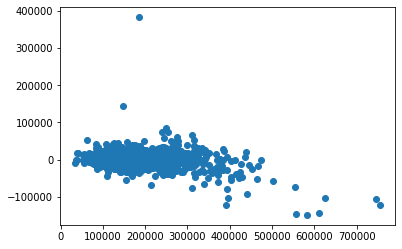

In [85]:
residual1=Xtrain_pred1-y_train
plt.scatter(y_train,residual1)

(array([  8.,  19., 845., 290.,   4.,   1.,   0.,   0.,   0.,   1.]),
 array([-148657.3377425 ,  -95540.556235  ,  -42423.77472751,
          10693.00677999,   63809.78828748,  116926.56979498,
         170043.35130248,  223160.13280997,  276276.91431747,
         329393.69582497,  382510.47733246]),
 <BarContainer object of 10 artists>)

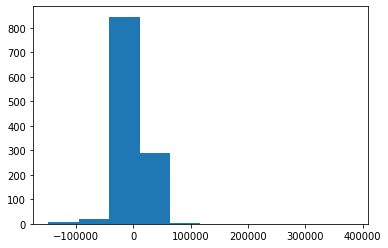

In [86]:
plt.hist(residual1)

In [87]:
from sklearn.metrics import r2_score

In [88]:
r2_score(y_train,Xtrain_pred1)

0.9157861137660976

In [89]:
r2_score(y_test,Xtest_pred1)

0.44820982716403723

In [90]:
#this is the clear sign of overfitting.

In [91]:
#here lets try to simplify model first then we will keep on adding the features based on various metricess like p-value and vif factor.

In [92]:
#lets try analyzing the VIF for the different features that we have.

In [93]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [94]:
len(housing_df1.columns)
len(X_train.columns)

234

In [95]:
vif_df= pd.DataFrame()
vif_df['Features']=X_train.columns
vif_score=[]
for d in range(len(X_train.columns)):
    scoreval=variance_inflation_factor(X_train,d)
    vif_score.append(scoreval)
vif_df['VIF_score']=vif_score
vif_df_sorted=vif_df.sort_values('VIF_score',ascending=False)

In [96]:
vif_df_sorted=vif_df.sort_values('VIF_score',ascending=False)
vif_df_sorted[vif_df_sorted.VIF_score==np.inf]

,Features,VIF_score
155,BsmtQual_NE,inf
168,BsmtFinType1_NE,inf
126,Exterior2nd_CBlock,inf
123,Exterior2nd_AsphShn,inf
112,Exterior1st_CBlock,inf
109,Exterior1st_AsphShn,inf
205,GarageType_NE,inf
206,GarageFinish_NE,inf
70,BldgType_Duplex,inf
211,GarageQual_NE,inf


In [97]:
#These inf value says that these variable  are perfectly  explained by some other variable so we can get rid 
# of some of these variable but we have to decide on what to chose and what not to choose.

In [99]:
vif_df_sorted[vif_df_sorted.VIF_score.isna()] #these VIF are Nan but the p-value for these variable seems significant 
# so lets keep these as well for now 

,Features,VIF_score
104,RoofMatl_Metal,NaN
198,Functional_Sev,NaN


In [100]:
#lets begin feature dropping one by one and analyze the p-value and the VIF score 
#but before that since the feature count are more it will be difficult to analyize it one by one 
#here we can take help of the RFE module from sklearn

In [101]:
vif_df_sorted[(vif_df_sorted.VIF_score!=np.inf)&(~vif_df_sorted.VIF_score.isna())]

,Features,VIF_score
92,OverallCond_5,28411.512549
93,OverallCond_6,8703.637364
94,OverallCond_7,7198.902452
95,OverallCond_8,2594.971227
91,OverallCond_4,1947.615931
...,...,...
227,SaleType_Oth,1.288282
25,3SsnPorch,1.239832
222,SaleType_Con,1.185267
67,Condition1_RRNe,1.176654


In [102]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler

In [103]:
mmscl=MinMaxScaler()
X_train_scl=mmscl.fit_transform(X_train)

In [105]:
lr1= LinearRegression()
lr_mod1=RFE(estimator=lr1,n_features_to_select=160) #selecting randomly 160 variable as a first step as there 
#are more categorical value
lr_mod1.fit(X_train_scl,y_train)

RFE(estimator=LinearRegression(), n_features_to_select=160)

In [452]:
# list(zip(lr_mod1.feature_names_in_,lr_mod1.ranking_,lr_mod1.support_))

In [106]:
np.count_nonzero(lr_mod1.ranking_==1)

160

In [107]:
ytrain_predlr=lr_mod1.predict(X_train_scl)
r2_score(y_train,ytrain_predlr)

0.9124924369429545

In [108]:
X_test_scl=mmscl.transform(X_test)
ytest_predlr=lr_mod1.predict(X_test_scl)
r2_score(y_test,ytest_predlr)

-1.1711367623977184e+20

In [ ]:
#Here the model seems to be giving around 94% of accuracy but while running the same thing on the test set the accuracy is 
# in negative so there might be something suspecious in the data pattern.

In [109]:
y_train.shape

(1168,)

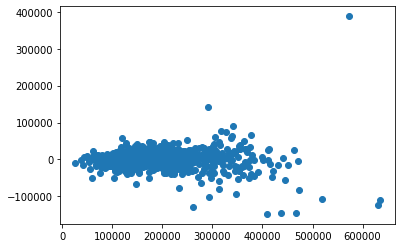

In [110]:
plt.scatter(x=ytrain_predlr,y=(ytrain_predlr-y_train)) #looks normal here 

In [111]:
y_test.shape

(292,)

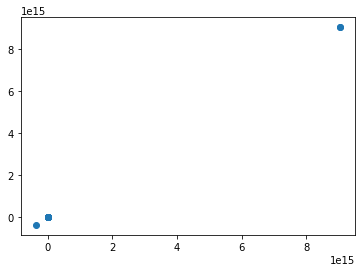

In [112]:
plt.scatter(x=ytest_predlr,y=(ytest_predlr-y_test)) #there is some pattern in the ressidual against prediction plot.

In [113]:
#Now let analyse which one is the problem predictor by plotting thhe residual against the various avaiable features

In [114]:
X_test_scl

array([[0.04452055, 0.0167752 , 0.96666667, ..., 0.        , 1.        ,
        0.        ],
       [0.20205479, 0.04099304, 0.91666667, ..., 0.        , 1.        ,
        0.        ],
       [0.16438356, 0.03635249, 0.7       , ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.13356164, 0.0295788 , 0.25      , ..., 0.        , 0.        ,
        0.        ],
       [0.16438356, 0.0293449 , 0.83333333, ..., 0.        , 1.        ,
        0.        ],
       [0.28767123, 0.04571311, 0.75      , ..., 0.        , 1.        ,
        0.        ]])

In [115]:
len(X_test_scl[0])

234

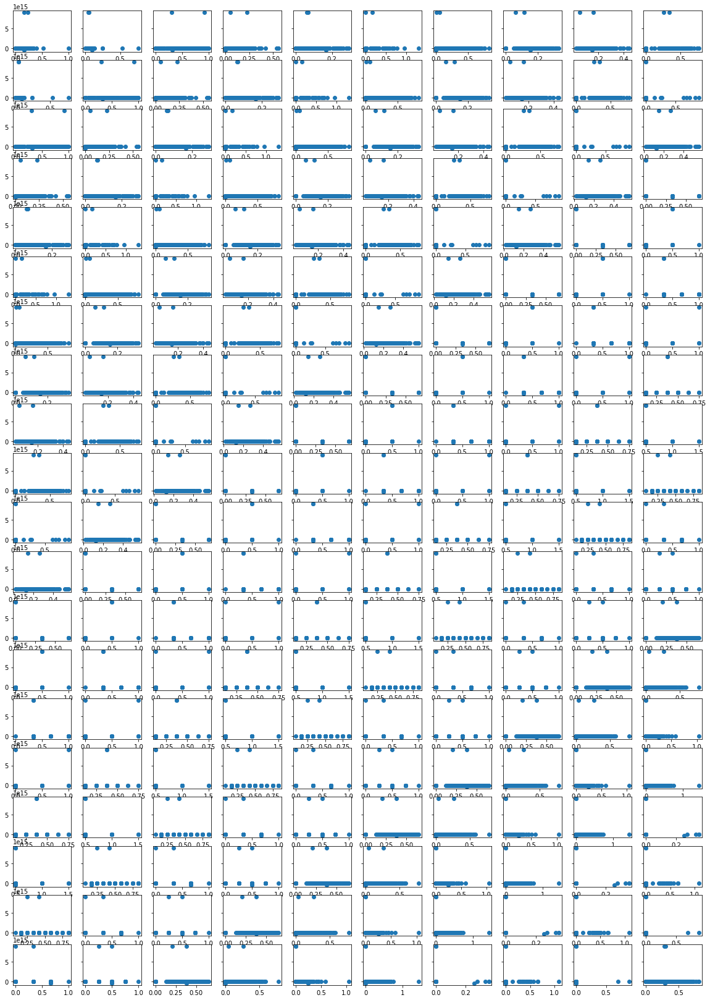

In [116]:
fig,ax = plt.subplots(20,10,sharey=True)
fig.set_size_inches((20,29))

for i in range(20):
    for j in range(10):
        if (i+j)>=len(X_test_scl[0]):
            break
        ax[i][j].scatter(X_test_scl[:,(i+j)],(ytest_predlr-y_test))



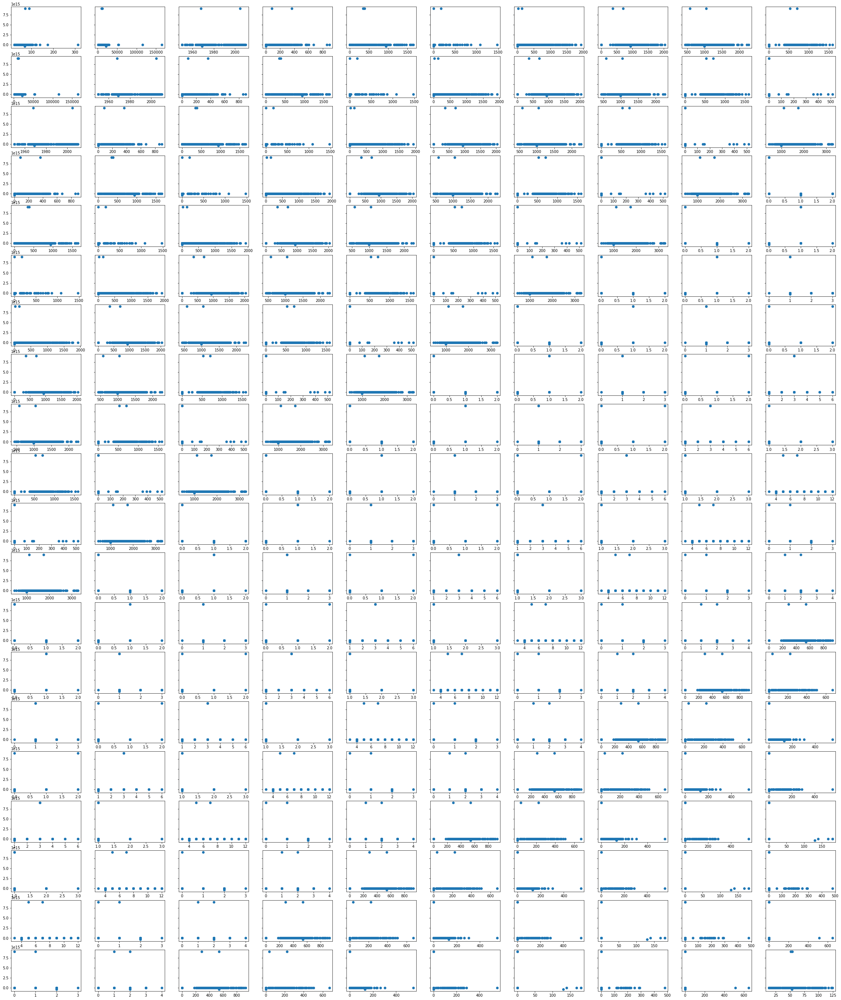

In [117]:
fig,ax = plt.subplots(20,10,sharey=True)
fig.set_size_inches((40,49))

for i in range(20):
    for j in range(10):
        if (i+j)>=len(X_test_scl[0]):
            break
        ax[i][j].scatter(X_test.iloc[:,(i+j)],(ytest_predlr-y_test))

In [444]:
fig,ax = plt.subplots(20,10,sharey=True)
fig.set_size_inches((20,29))

for i in range(20):
    for j in range(10):
        if (i+j)>=len(X_test_scl[0]):
            break
        ax[i][j].scatter(X_test_scl[:,(i+j)],(ytest_predlr-y_test))

-8.940222628617866e+21

In [118]:
from sklearn.linear_model import Lasso,Ridge

In [143]:
lso_model=Lasso()
lso_mod1=RFE(estimator=lso_model,n_features_to_select=230) #selecting randomly 160 variable as a first step
lso_mod1.fit(X_train_scl,y_train)

RFE(estimator=Lasso(), n_features_to_select=230)

In [144]:
ytrain_predlasso=lso_mod1.predict(X_train_scl)
r2_score(y_train,ytrain_predlasso)

0.9156785384884387

In [145]:
X_test_scl=mmscl.transform(X_test)
ytest_predlasso=lso_mod1.predict(X_test_scl)
r2_score(y_test,ytest_predlasso)

0.4883784540556375

In [122]:
ridg_model=Ridge()
ridg_mod1=RFE(estimator=ridg_model,n_features_to_select=230) #selecting randomly 50,100,160,200,239,230 variable as a first step
ridg_mod1.fit(X_train_scl,y_train)

RFE(estimator=Ridge(), n_features_to_select=230)

In [123]:
ytrain_predridge=ridg_mod1.predict(X_train_scl)
r2_score(y_train,ytrain_predridge)

0.8900048897449235

In [124]:
X_test_scl=mmscl.transform(X_test)
ytest_predridge=ridg_mod1.predict(X_test_scl)
r2_score(y_test,ytest_predridge)

0.8727818866922676

In [125]:
alpha_values=[0.0001,0.001,0.01,0.1,1,10,100,1000]
train_score=[]
test_score=[]
for v in alpha_values:
    print("Running for alpha value "+str(v))
    ridg_model=Ridge(alpha=v)
    ridg_mod1=RFE(estimator=ridg_model,n_features_to_select=230) #selecting randomly 50,100,160,200,239,230 variable as a first step
    ridg_mod1.fit(X_train_scl,y_train)
    #analyze train data
    ytrain_predridge=ridg_mod1.predict(X_train_scl)
    score=r2_score(y_train,ytrain_predridge)
    train_score.append(score)
    #analyze test data
    X_test_scl=mmscl.transform(X_test)
    ytest_predridge=ridg_mod1.predict(X_test_scl)
    score1=r2_score(y_test,ytest_predridge)
    test_score.append(score1)


Running for alpha value 0.0001
Running for alpha value 0.001
Running for alpha value 0.01
Running for alpha value 0.1
Running for alpha value 1
Running for alpha value 10
Running for alpha value 100
Running for alpha value 1000


In [131]:
print(alpha_values,'\n',train_score,'\n',test_score)

[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000] 
 [0.9157860359975926, 0.9157792610181474, 0.915272218266052, 0.90610316157596, 0.8900048897449235, 0.8680749025367529, 0.7865165218844197, 0.5485331490648895] 
 [0.44980118513678946, 0.46385190392781395, 0.5729360170505889, 0.8189966353886966, 0.8727818866922676, 0.8703921334294341, 0.8019764922021724, 0.5934169266649358]


Text(0, 0.5, 'accuracy value')

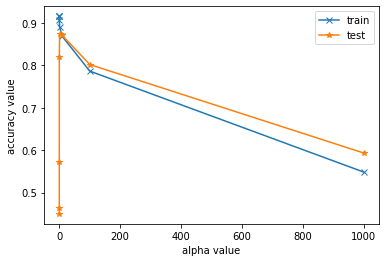

In [200]:
fig,ax = plt.subplots()
ax.plot(alpha_values,train_score,label="train",marker='x')
ax.plot(alpha_values,test_score,label="test",marker='*')
plt.legend()
plt.xlabel("alpha value")
plt.ylabel("accuracy value")

In [135]:
# This clearly shows that the alpha value at 5th index in the list is showing the best performance
#which is given by
alpha_values[4]

1

In [136]:
lss_alpha_values=[0.0001,0.001,0.01,0.1,1,10,100,1000]
lss_train_score=[]
lss_test_score=[]
for v in alpha_values:
    print("Running for alpha value "+str(v))
    lasso_model=Lasso(alpha=v)
    lasso_mod1=RFE(estimator=lasso_model,n_features_to_select=230) #selecting randomly 50,100,160,200,239,230 variable as a first step
    lasso_mod1.fit(X_train_scl,y_train)
    #analyze train data
    ytrain_predlasso=lasso_mod1.predict(X_train_scl)
    score=r2_score(y_train,ytrain_predlasso)
    lss_train_score.append(score)
    #analyze test data
    X_test_scl=mmscl.transform(X_test)
    ytest_predlasso=lasso_mod1.predict(X_test_scl)
    score1=r2_score(y_test,ytest_predlasso)
    lss_test_score.append(score1)

Running for alpha value 0.0001
Running for alpha value 0.001
Running for alpha value 0.01
Running for alpha value 0.1
Running for alpha value 1
Running for alpha value 10
Running for alpha value 100
Running for alpha value 1000


Text(0, 0.5, 'accuracy value')

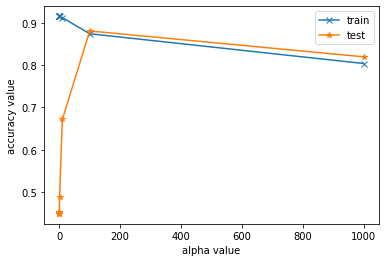

In [194]:
fig,ax = plt.subplots()
ax.plot(lss_alpha_values,lss_train_score,label="train",marker='x')
ax.plot(lss_alpha_values,lss_test_score,label="test",marker='*')
plt.legend()
plt.xlabel("alpha value")
plt.ylabel("accuracy value")

In [147]:
print(lss_alpha_values,'\n',lss_train_score,'\n',lss_test_score)

[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000] 
 [0.9157818414985485, 0.9157818275908837, 0.9157816806899987, 0.9157794584456189, 0.9156785384884387, 0.9126174185691925, 0.8743812799405632, 0.8040081667043775] 
 [0.44832998986567896, 0.44852689786334254, 0.44956851052834135, 0.4532028275511816, 0.4883784540556375, 0.6716359548589954, 0.8809816233165524, 0.8198278082691188]


In [148]:
# In this case second last is at the highest in the plot above showing that alpha giving better prediction is 
# lying at second last position in the list 
#which is given by 
lss_alpha_values[-2]

100

In [ ]:
# Performing Residual analysis to seee if the scoring is really trustworthy


In [149]:
lasso_model=Lasso(alpha=100)
lasso_mod1=RFE(estimator=lasso_model,n_features_to_select=230) #selecting randomly 50,100,160,200,239,230 variable as a first step
lasso_mod1.fit(X_train_scl,y_train)
#analyze train data
ytrain_predlasso=lasso_mod1.predict(X_train_scl)
score=r2_score(y_train,ytrain_predlasso)
print(score)
#analyze test data
X_test_scl=mmscl.transform(X_test)
ytest_predlasso=lasso_mod1.predict(X_test_scl)
score1=r2_score(y_test,ytest_predlasso)
print(score1)

0.8743812799405632
0.8809816233165524


Text(0, 0.5, 'residuals')

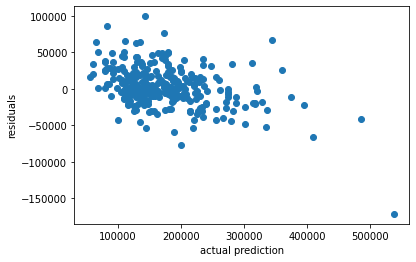

In [201]:
plt.scatter(y_test,(ytest_predlasso-y_test))
plt.xlabel('actual prediction')
plt.ylabel("residuals")

(array([  1.,   0.,   0.,   8.,  35., 146.,  77.,  20.,   3.,   2.]),
 array([-143301.02484168, -118184.57802311,  -93068.13120454,
         -67951.68438597,  -42835.23756739,  -17718.79074882,
           7397.65606975,   32514.10288832,   57630.5497069 ,
          82746.99652547,  107863.44334404]),
 <BarContainer object of 10 artists>)

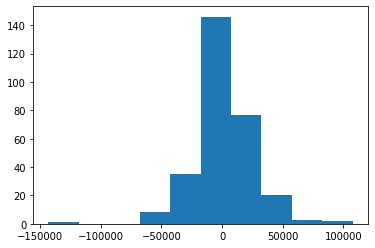

In [152]:
plt.hist((ytest_predlasso-y_test))

In [154]:
ridg_model=Ridge(alpha=1)
ridg_mod1=RFE(estimator=ridg_model,n_features_to_select=230) #selecting randomly 50,100,160,200,239,230 variable as a first step
ridg_mod1.fit(X_train_scl,y_train)
#analyze train data
ytrain_predridge=ridg_mod1.predict(X_train_scl)
score=r2_score(y_train,ytrain_predridge)
print(score)
#analyze test data
X_test_scl=mmscl.transform(X_test)
ytest_predridge=ridg_mod1.predict(X_test_scl)
score1=r2_score(y_test,ytest_predridge)
print(score1)

0.8900048897449235
0.8727818866922676


In [ ]:
# Performing Residual analysis to seee if the scoring is really trustworthy

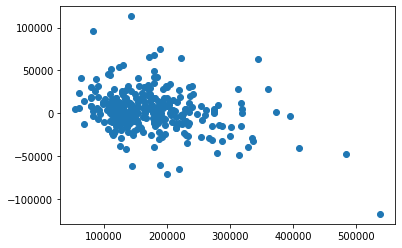

In [155]:
plt.scatter(y_test,(ytest_predridge-y_test))

(array([  1.,   0.,   0.,   8.,  35., 146.,  77.,  20.,   3.,   2.]),
 array([-143301.02484168, -118184.57802311,  -93068.13120454,
         -67951.68438597,  -42835.23756739,  -17718.79074882,
           7397.65606975,   32514.10288832,   57630.5497069 ,
          82746.99652547,  107863.44334404]),
 <BarContainer object of 10 artists>)

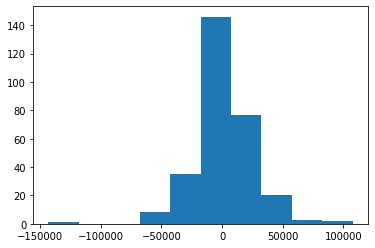

In [156]:
plt.hist((ytest_predlasso-y_test))

In [166]:
scaled_dfx=pd.DataFrame(X_train_scl,columns=X_train.columns)
scaled_dfy=pd.DataFrame(X_test_scl,columns=X_test.columns)

In [170]:
del scaled_df

In [192]:
ridg_model=Ridge(alpha=2)
ridg_mod1=RFE(estimator=ridg_model,n_features_to_select=20) #selecting randomly 50,100,160,200,239,230 variable as a first step
ridg_mod1.fit(scaled_dfx,y_train)
#analyze train data
ytrain_predridge=ridg_mod1.predict(X_train_scl)
score=r2_score(y_train,ytrain_predridge)
print(score)
#analyze test data
# X_test_scl=mmscl.transform(X_test)
ytest_predridge=ridg_mod1.predict(scaled_dfy)
score1=r2_score(y_test,ytest_predridge)
print(score1)

0.8185081656529576
0.8320335837556047


In [193]:
ridg_mod1.feature_names_in_[ridg_mod1.support_]

array(['LotArea', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'GrLivArea', 'BsmtFullBath', 'FullBath', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'houseAge',
       'LotShape_IR3', 'OverallQual_10', 'OverallQual_8', 'OverallQual_9',
       'RoofMatl_WdShngl', 'BsmtQual_Fa', 'BsmtFinType1_NE'], dtype=object)

In [187]:
lasso_model=Lasso(alpha=200)
lasso_mod1=RFE(estimator=lasso_model,n_features_to_select=20) #selecting randomly 50,100,160,200,239,230 variable as a first step
lasso_mod1.fit(scaled_dfx,y_train)
#analyze train data
ytrain_predlasso=lasso_mod1.predict(scaled_dfx)
score=r2_score(y_train,ytrain_predlasso)
print(score)
#analyze test data
X_test_scl=mmscl.transform(X_test)
ytest_predlasso=lasso_mod1.predict(scaled_dfy)
score1=r2_score(y_test,ytest_predlasso)
print(score1)

0.8364025948650208
0.837777298656458


In [188]:
lasso_mod1.feature_names_in_[lasso_mod1.support_]

array(['YearRemodAdd', 'MasVnrArea', 'GrLivArea', 'BsmtFullBath',
       'FullBath', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'Condition1_Norm', 'OverallQual_10', 'OverallQual_8',
       'OverallQual_9', 'RoofMatl_WdShngl', 'Exterior1st_BrkFace',
       'Exterior2nd_Stucco', 'BsmtExposure_Gd', 'KitchenQual_TA',
       'Functional_Typ', 'SaleCondition_Partial'], dtype=object)

In [189]:
ridg_model=Ridge(alpha=1)
ridg_mod1=RFE(estimator=ridg_model,n_features_to_select=20) #selecting randomly 160 variable as a first step
ridg_mod1.fit(scaled_dfx,y_train)
#analyze train data
ytrain_predridge=ridg_mod1.predict(X_train_scl)
score=r2_score(y_train,ytrain_predridge)
print(score)
#analyze test data
# X_test_scl=mmscl.transform(X_test)
ytest_predridge=ridg_mod1.predict(scaled_dfy)
score1=r2_score(y_test,ytest_predridge)
print(score1)

0.810913699072451
0.8063838752566481


In [181]:
ridg_mod1.feature_names_in_[ridg_mod1.support_]

array(['LotArea', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'GrLivArea', 'BsmtFullBath', 'FullBath', 'KitchenAbvGr',
       'GarageCars', 'OverallQual_10', 'OverallQual_8', 'OverallQual_9',
       'RoofStyle_Shed', 'RoofMatl_CompShg', 'RoofMatl_Membran',
       'RoofMatl_Tar&Grv', 'RoofMatl_WdShake', 'RoofMatl_WdShngl',
       'Heating_OthW'], dtype=object)